In [1]:
import pathlib

import numpy as np
import open3d as o3d
import copy
import matplotlib.pyplot as plt

from pin_segment import RgbdPinFetcher, SfMPinFetcher
import linear_algebra as util_la
import cross_align as util_ca
import pin_center as util_pc
import icp_align as util_ia

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
dataset_root = pathlib.Path(r'/home/crest/w/hwang_Pro/datasets/3DPotatoTwin')
pin_ref_folder = pathlib.Path(r'/home/crest/Documents/Github/PotatoScan/3dscan/03_sfm_rgbd_registration/pin_ref')

rgbd_fetcher = RgbdPinFetcher(dataset_root)
sfm_fetcher = SfMPinFetcher(dataset_root, pin_ref_folder)

loading annotations into memory...
Done (t=0.19s)
creating index...
index created!


In [3]:
pid = "R3-6"   # the most challenging one

In [4]:
rgbd_data = rgbd_fetcher.get(pid, visualize=True, show=False)
sfm_data = sfm_fetcher.get(pid, visualize=True, show=False)

sfm_pin_data = util_pc.find_pin_center(
    sfm_data['pin_pcd'], sfm_data['pcd'], 
    circle_color=[0,0,0], visualize=True, show=False
)
rgbd_pin_data = util_pc.find_pin_center(
    rgbd_data['pin_pcd'], rgbd_data['pcd'], 
    circle_color=[0,0,0], visualize=True, show=False
)

search_radius = 0.03
# find the pin neighbour of sfm
sfm_nbr_data = util_ia.find_pin_nbr(sfm_data, sfm_pin_data, search_radius, visualize=True)
rgbd_nbr_data = util_ia.find_pin_nbr(rgbd_data, rgbd_pin_data, search_radius, visualize=True)


# intial transform matrix by pin
imatrix =  util_la.create_rotational_transform_matrix(
    rgbd_pin_data['circle_center_3d'], rgbd_pin_data['vector'],
    sfm_pin_data['circle_center_3d'], sfm_pin_data['vector'],
)
rgbd_data_it = {}
rgbd_data_it['pcd'] = copy.deepcopy(rgbd_data['pcd']).transform(imatrix)
rgbd_data_it['pin_idx'] = rgbd_data['pin_idx']
rgbd_data_it['pin_pcd'] = rgbd_data_it['pcd'].select_by_index(rgbd_data['pin_idx'])

rgbd_pin_data_it = util_pc.find_pin_center(
    rgbd_data_it['pin_pcd'], rgbd_data_it['pcd'], 
    circle_color=[0,0,0], visualize=True, show=False
)
# find the pin neighbor of rgbd
rgbd_nbr_data_it = util_ia.find_pin_nbr(rgbd_data_it, rgbd_pin_data_it, radius= search_radius)

:: iterative pin segmentation of SfM point clouds
    Stop at thresh=0.35 with hull volume = 57.188190396365236
:: Correct pin vector direction
   st = 0.024901174005667586 | ed = 0.014901174005667582 | min = 1.2415446172748049e-07 | max = 0.029283734496958865
   pin vector from [ 0.61102944 -0.79132896  0.02101178] to [-0.61102944  0.79132896 -0.02101178]
:: Correct pin vector direction
   st = 0.25770188048842807 | ed = 0.2677018804884281 | min = 0.2548788070821822 | max = 0.29218905216898905
   pin vector from [0.22409537 0.37634412 0.89896961] to [-0.22409537 -0.37634412 -0.89896961]
   st = 0.020949592372143482 | ed = 0.010949592372143482 | min = 4.704072875498511e-07 | max = 0.033225845158599554
   st = 0.29863164844752965 | ed = 0.30863164844752966 | min = 0.2953650603446097 | max = 0.32104259005896396
:: Correct pin vector direction
   st = 0.02490117400566914 | ed = 0.014901174005669137 | min = 1.5968594014028825e-06 | max = 0.027724247411914746
   pin vector from [ 0.61102944

In [5]:
sfm_nbr_cross_pcd, sfm_uv_id = util_ca.get_nbr_cross(
    sfm_nbr_data['nbr_pcd'], 
    sfm_pin_data['circle_center_3d'],
    sfm_pin_data['vector'],
    buffer=0.001
)

rgbd_nbr_cross_pcd, rgbd_uv_id = util_ca.get_nbr_cross(
    rgbd_nbr_data_it['nbr_pcd'], 
    rgbd_pin_data_it['circle_center_3d'],
    rgbd_pin_data_it['vector'],
    buffer=0.001
)

In [6]:
o3d.visualization.draw_plotly([sfm_nbr_cross_pcd, rgbd_nbr_cross_pcd])

In [7]:
util_la.compute_distance_rmse(rgbd_nbr_cross_pcd, sfm_nbr_cross_pcd)

0.0022857984011177813

# Start DIY rotate 

In [8]:
rotate_point = sfm_pin_data['circle_center_3d']

n = sfm_pin_data['vector']
u,v = util_la.calculate_normal_uv(n)

# create n, u, v for visualize
n_mesh = util_pc.create_vector_arrow(rotate_point, n, color=np.array([0,0,0]))
u_mesh = util_pc.create_vector_arrow(rotate_point, u, color=np.array([0,0,1]))
v_mesh = util_pc.create_vector_arrow(rotate_point, v, color=np.array([1,0,0]))

source_pcd = rgbd_nbr_data_it['nbr_pcd']

In [9]:
sfm_cross_u, sfm_cross_v, sfm_u_id, sfm_v_id = util_ca.get_nbr_cross(
    sfm_nbr_data['nbr_pcd'], 
    plane_point=rotate_point,
    plane_normal=n,
    buffer=0.001,
    merge=False
)

rotate around normal_n

In [10]:
n_angle = 90

rot_matrix = util_la.rotation_matrix_around_vector(n, rotate_point, n_angle)

source_rotate_n_pcd = copy.deepcopy(source_pcd).transform(rot_matrix)
source_rotate_n_pcd.paint_uniform_color([1,0,0])

PointCloud with 6830 points.

In [11]:
o3d.visualization.draw_plotly([
    # sfm_nbr_cross_pcd, rgbd_nbr_cross_pcd, 
    source_pcd, source_rotate_n_pcd,
    n_mesh, u_mesh, v_mesh
])

test rotate around u

In [12]:
n_angle = 90

rot_matrix = util_la.rotation_matrix_around_vector(u, rotate_point, n_angle)

source_rotate_n_pcd = copy.deepcopy(source_pcd).transform(rot_matrix)
source_rotate_n_pcd.paint_uniform_color([0,1,0])

PointCloud with 6830 points.

In [13]:
o3d.visualization.draw_plotly([
    # sfm_nbr_cross_pcd, rgbd_nbr_cross_pcd, 
    source_pcd, source_rotate_n_pcd,
    n_mesh, u_mesh, v_mesh
])

Calculate the cross after n rotation of rgbd pcd

In [14]:
n_angle = 90

rot_matrix = util_la.rotation_matrix_around_vector(n, rotate_point, n_angle)

source_rotate_n_pcd = copy.deepcopy(source_pcd).transform(rot_matrix)

rgbd_cross_u, rgbd_cross_v, rgbd_u_id, rgbd_v_id = util_ca.get_nbr_cross(
    source_rotate_n_pcd, 
    plane_point=rotate_point,
    plane_normal=n,
    buffer=0.001,
    merge=False
)

In [15]:
o3d.visualization.draw_plotly([
    sfm_cross_u, rgbd_cross_u
])

Plot to 2d

In [16]:
_, sfm_cross_u_flatten, _ = util_la.project_to_plane_vectorized(
    np.asarray(sfm_cross_u.points), rotate_point, u 
)

_, rgbd_cross_u_flatten, _ = util_la.project_to_plane_vectorized(
    np.asarray(rgbd_cross_u.points), rotate_point, u
)

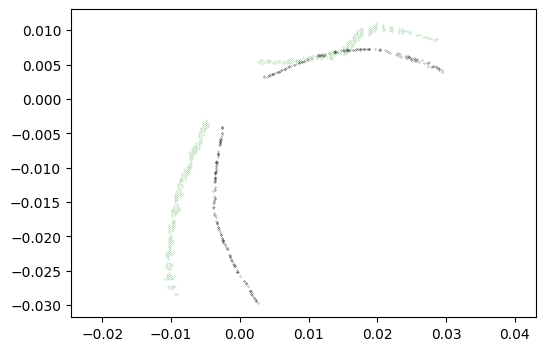

In [17]:
fig, ax = plt.subplots(1,1, figsize=(6,4))

ax.scatter(*sfm_cross_u_flatten.T, c='k',s=0.1, marker='.')
ax.scatter(*rgbd_cross_u_flatten.T, c='g', s=0.1, marker='.', alpha=0.7)

plt.axis('equal')

plt.show()

rotate around v

0 -45 0.014492225415990495
1 -40 0.014009880579199356
2 -35 0.0132035276178806
3 -30 0.012057520729173682
4 -25 0.010823273378947219
5 -20 0.009557054784285807
6 -15 0.008295799714512242
7 -10 0.007070588416718481
8 -5 0.005944808166846142
9 0 0.005029647737876634
10 5 0.00448816869585826
11 10 0.004475173801506385
12 15 0.00499641674807136
13 20 0.005897097486651364
14 25 0.006992569745514078
15 30 0.008177560018994686
16 35 0.00937686241467568
17 40 0.010515860365629608
18 45 0.011598806476304147
Minimum rMSE 0.004475173801506385 at angle=10


/tmp/ipykernel_1550244/1409403239.py:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



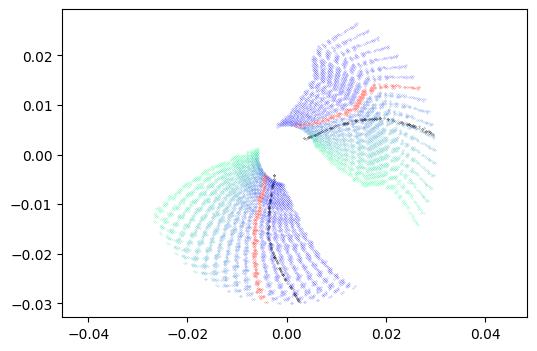

In [19]:
fig, ax = plt.subplots(1,1, figsize=(6,4))

ax.scatter(*sfm_cross_u_flatten.T, color='k',s=0.1, marker='.')

u_rmses = []
u_angles = []
u_matrix = []
ax_scatters = []

for i, a in enumerate(range(-9, 10)):

    angle = a * 5

    # need to rotate around v axis to rotate on u
    rot_matrix = util_la.rotation_matrix_around_vector(u, rotate_point, angle)

    color = plt.cm.get_cmap('winter_r')(i * 20)

    rgbd_cross_u_rotate = copy.deepcopy(rgbd_cross_u).transform(rot_matrix)

    _, rgbd_cross_u_flatten, _ = util_la.project_to_plane_vectorized(
        np.asarray(rgbd_cross_u_rotate.points), rotate_point, u
    )

    rmse = util_la.compute_distance_rmse(sfm_cross_u, rgbd_cross_u_rotate)

    u_rmses.append(rmse)
    u_angles.append(angle)
    u_matrix.append(rot_matrix)

    print(i, angle, rmse)

    ax_scatters.append(
        ax.scatter(*rgbd_cross_u_flatten.T, color=color, s=0.1, marker='.', alpha=0.7)
    )


# find the minimum rmse rotation angle
u_rmses = np.asarray(u_rmses)

best_idx = np.argmin(u_rmses)
best_u_angle = u_angles[best_idx]
best_u_matrix = u_matrix[best_idx]

print(f"Minimum rMSE {u_rmses[best_idx]} at angle={best_u_angle}")

# change the selected color
ax_scatters[best_idx].set_color('r')
ax_scatters[best_idx].set_alpha(1)

plt.axis('equal')

plt.show()

In [20]:
def iterative_uv_rotate_one(source_pcd, target_pcd, rotate_point, rotate_vector, ax=None):
    """
    ax = None => no ploting
    """

    # target -> sfm
    _, target_cross_flatten, _ = util_la.project_to_plane_vectorized(
        np.asarray(target_pcd.points), rotate_point, rotate_vector
    )
    
    if ax is not None:
        ax.scatter(*target_cross_flatten.T, color='k',s=0.1, marker='.')

    rmses = []
    angles = []
    matrics = []
    ax_scatters = []

    for i, a in enumerate(range(-9, 10)):

        angle = a * 5

        # need to rotate around v axis to rotate on u
        rot_matrix = util_la.rotation_matrix_around_vector(rotate_vector, rotate_point, angle)

        color = plt.cm.get_cmap('winter_r')(i * 20)

        source_cross_rotate = copy.deepcopy(source_pcd).transform(rot_matrix)

        _, rgbd_cross_u_flatten, _ = util_la.project_to_plane_vectorized(
            np.asarray(source_cross_rotate.points), rotate_point, rotate_vector
        )

        rmse = util_la.compute_distance_rmse(target_pcd, source_cross_rotate)

        rmses.append(rmse)
        angles.append(angle)
        matrics.append(rot_matrix)

        # print(i, angle, rmse)

        if ax is not None:
            ax_scatters.append(
                ax.scatter(*rgbd_cross_u_flatten.T, color=color, s=0.1, marker='.', alpha=0.7)
            )


    # find the minimum rmse rotation angle
    rmses = np.asarray(rmses)

    best_idx = np.argmin(rmses)
    best_angle = angles[best_idx]
    best_matrix = matrics[best_idx]

    print(f"Minimum rMSE {rmses[best_idx]} at angle={best_angle}")

    if ax is not None:
        # change the selected color
        ax_scatters[best_idx].set_color('r')
        ax_scatters[best_idx].set_alpha(1)

        ax.set_aspect('equal')
        ax.xaxis.set_ticks([])
        ax.yaxis.set_ticks([]) 

    out = {
        "rmses": rmses,
        "angles": np.asarray(angles),
        "matrics": matrics,
        "best_idx": best_idx,
        "best_angle": best_angle,
        "best_matrix": best_matrix
    }

    return out

/tmp/ipykernel_1550244/446794046.py:26: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



Minimum rMSE 0.004475173801506385 at angle=10


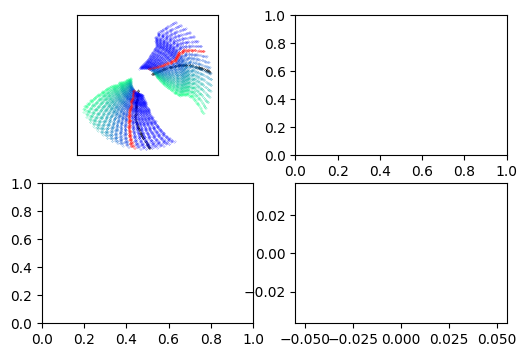

In [21]:
fig, ax = plt.subplots(2,2, figsize=(6,4))

u_out = iterative_uv_rotate_one(rgbd_cross_u, sfm_cross_u, rotate_point, u, ax[0,0])

plt.axis('equal')

plt.show()

/tmp/ipykernel_1550244/446794046.py:26: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



Minimum rMSE 0.004475173801506385 at angle=10
Minimum rMSE 0.00644985204412278 at angle=-10


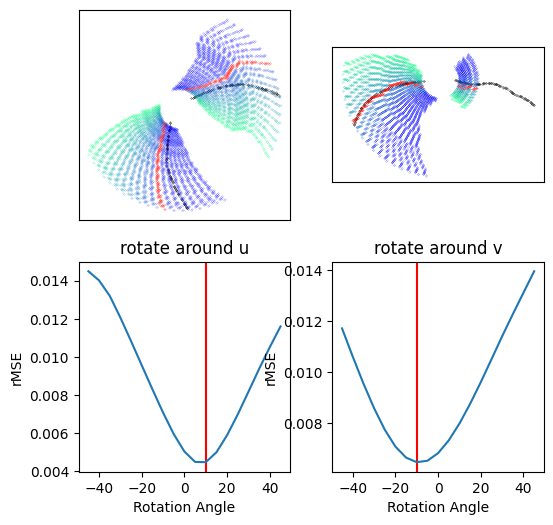

In [22]:
fig, ax = plt.subplots(2,2, figsize=(6,6))

u_out = iterative_uv_rotate_one(rgbd_cross_u, sfm_cross_u, rotate_point, u, ax[0,0])
v_out = iterative_uv_rotate_one(rgbd_cross_v, sfm_cross_v, rotate_point, v, ax[0,1])

ax[1,0].axvline(x=u_out['best_angle'], color='r')
ax[1,1].axvline(x=v_out['best_angle'], color='r')

ax[1,0].set_title('rotate around u')
ax[1,1].set_title('rotate around v')

ax[1,0].plot(u_out['angles'], u_out['rmses'])
ax[1,1].plot(v_out['angles'], v_out['rmses'])

ax[1,0].set_xlabel('Rotation Angle')
ax[1,0].set_ylabel('rMSE')
ax[1,1].set_xlabel('Rotation Angle')
ax[1,1].set_ylabel('rMSE')

plt.show()

check how the best looks in 3d:

In [23]:
n_angle = 90

rot_matrix = util_la.rotation_matrix_around_vector(n, rotate_point, n_angle)

optimized_rotate_matrix = u_out['best_matrix'] @ u_out['best_matrix'] @ rot_matrix

source_rotate_n_pcd = copy.deepcopy(source_pcd).transform(optimized_rotate_matrix)
source_rotate_n_pcd.paint_uniform_color([0,1,0])

o3d.visualization.draw_plotly([
    sfm_nbr_data['nbr_pcd'],
    source_pcd, source_rotate_n_pcd,
])

Loop for normal rotation

In [24]:
rotate_point = sfm_pin_data['circle_center_3d']

n = sfm_pin_data['vector']
u,v = util_la.calculate_normal_uv(n)

# create n, u, v for visualize
n_mesh = util_pc.create_vector_arrow(rotate_point, n, color=np.array([0,0,0]))
u_mesh = util_pc.create_vector_arrow(rotate_point, u, color=np.array([0,0,1]))
v_mesh = util_pc.create_vector_arrow(rotate_point, v, color=np.array([1,0,0]))

source_pcd = rgbd_nbr_data_it['nbr_pcd']

sfm_cross_u, sfm_cross_v, sfm_u_id, sfm_v_id = util_ca.get_nbr_cross(
    sfm_nbr_data['nbr_pcd'], 
    plane_point=rotate_point,
    plane_normal=n,
    buffer=0.001,
    merge=False
)

In [25]:
rmses = []
angles = []
matrix = []


for angle in range(1, 36):

    rot_matrix = util_la.rotation_matrix_around_vector(n, rotate_point, angle*10)
    # rgbd -> to rotate
    source_n_rotate_pcd = copy.deepcopy(source_pcd).transform(rot_matrix)

    rgbd_nbr_cross_pcd, rgbd_uv_id = util_ca.get_nbr_cross(
        source_n_rotate_pcd, 
        rgbd_pin_data_it['circle_center_3d'],
        rgbd_pin_data_it['vector'],
        buffer=0.001
    )

    # fig, ax = plt.subplots(2,2, figsize=(6,6))

    # u_out = iterative_uv_rotate_one(rgbd_cross_u, sfm_cross_u, rotate_point, u, ax[0,0])
    # v_out = iterative_uv_rotate_one(rgbd_cross_v, sfm_cross_v, rotate_point, v, ax[0,1])
    u_out = iterative_uv_rotate_one(rgbd_cross_u, sfm_cross_u, rotate_point, u)
    v_out = iterative_uv_rotate_one(rgbd_cross_v, sfm_cross_v, rotate_point, v)

    # ax[1,0].axvline(x=u_out['best_angle'], color='r')
    # ax[1,1].axvline(x=v_out['best_angle'], color='r')

    # ax[1,0].set_title('rotate around u')
    # ax[1,1].set_title('rotate around v')

    # ax[1,0].plot(u_out['angles'], u_out['rmses'])
    # ax[1,1].plot(v_out['angles'], v_out['rmses'])

    # ax[1,0].set_xlabel('Rotation Angle')
    # ax[1,0].set_ylabel('rMSE')
    # ax[1,1].set_xlabel('Rotation Angle')
    # ax[1,1].set_ylabel('rMSE')

    # plt.show()
    
    optimized_rotate_matrix = u_out['best_matrix'] @ v_out['best_matrix'] @ rot_matrix

    source_rotate_n_pcd = copy.deepcopy(source_pcd).transform(optimized_rotate_matrix)

    rmse = util_la.compute_distance_rmse(sfm_nbr_data['nbr_pcd'], source_rotate_n_pcd)

    print(f"   N angle = {angle} with u angle = {u_out['best_angle']} and v angle = {v_out['best_angle']}\n"
          f"      with general rmse= {rmse}"
    )

    # result_icp = util_ia.shape_based_icp(rgbd_nbr_cross_pcd, sfm_nbr_cross_pcd)

    rmses.append(rmse)
    matrix.append(optimized_rotate_matrix)
    angles.append(angle * 10)

    # print(f"- Rotate {angle * 10} | RMSE={result_icp.inlier_rmse}")

/tmp/ipykernel_1550244/446794046.py:26: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



Minimum rMSE 0.004475173801506385 at angle=10
Minimum rMSE 0.00644985204412278 at angle=-10
   N angle = 1 with u angle = 10 and v angle = -10
      with general rmse= 0.006158931813424756
Minimum rMSE 0.004475173801506385 at angle=10
Minimum rMSE 0.00644985204412278 at angle=-10
   N angle = 2 with u angle = 10 and v angle = -10
      with general rmse= 0.0058399786953134995
Minimum rMSE 0.004475173801506385 at angle=10
Minimum rMSE 0.00644985204412278 at angle=-10
   N angle = 3 with u angle = 10 and v angle = -10
      with general rmse= 0.005640400553797131
Minimum rMSE 0.004475173801506385 at angle=10
Minimum rMSE 0.00644985204412278 at angle=-10
   N angle = 4 with u angle = 10 and v angle = -10
      with general rmse= 0.005567153826106806
Minimum rMSE 0.004475173801506385 at angle=10
Minimum rMSE 0.00644985204412278 at angle=-10
   N angle = 5 with u angle = 10 and v angle = -10
      with general rmse= 0.005629594608944169
Minimum rMSE 0.004475173801506385 at angle=10
Minimum 

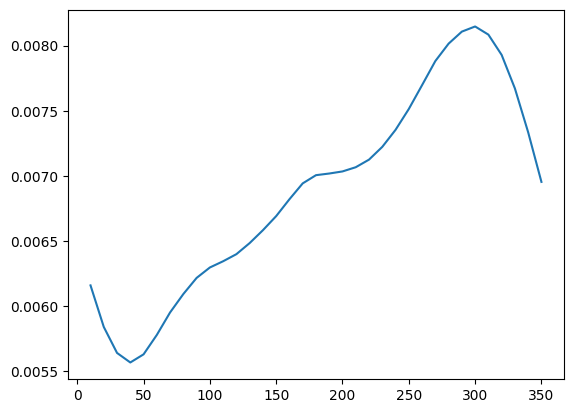

In [ ]:
plt.plot(angles, rmses)

In [26]:
best_idx = np.argmin(rmses)
best_matrix = matrix[best_idx]

print(angles[best_idx], rmses[best_idx], best_matrix)

40 0.005567153826106806 [[ 0.7754444   0.03769751  0.63028952 -0.06580008]
 [-0.18921105  0.966217    0.17499683 -0.01947023]
 [-0.60239951 -0.25495805  0.75638035  0.01890776]
 [ 0.          0.          0.          1.        ]]


In [27]:
rgbd_rotated = copy.deepcopy(rgbd_data['pcd']).transform(best_matrix @ imatrix)

In [28]:
o3d.visualization.draw_plotly([sfm_data['pcd'], rgbd_rotated])

Find the valleys as alternative for lowest point

In [33]:
from scipy.signal import find_peaks

In [46]:
rmses = np.asarray(rmses)

In [38]:
peaks, _ = find_peaks(-np.asarray(rmses), distance=5)  # 10 degree one sample, 50 = 5
peaks

array([3])

In [43]:
np.asarray(rmses)[peaks]

array([0.00556715])

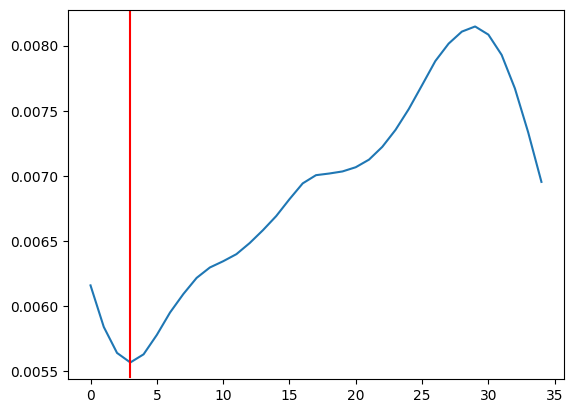

In [49]:
plt.plot(rmses)

for i in peaks:
    plt.axvline(i, rmses[i], color='r')

plt.show()

In [50]:
import matplotlib.cm as cm


/tmp/ipykernel_1550244/1073483349.py:1: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



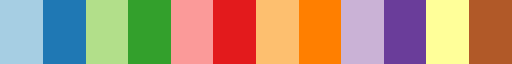

In [52]:
cm.get_cmap('Paired')

In [53]:
cm.get_cmap('Paired')(1)

/tmp/ipykernel_1550244/255770905.py:1: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



(0.12156862745098039, 0.47058823529411764, 0.7058823529411765, 1.0)

In [55]:
np.arange(0, 10) % 3

array([0, 1, 2, 0, 1, 2, 0, 1, 2, 0])

In [56]:
from tkinter import messagebox

In [59]:
import ctypes  # An included library with Python install.   
ctypes.windll.user32.MessageBoxW(0, "Your text", "Your title", 1)

AttributeError: module 'ctypes' has no attribute 'windll'

In [61]:
import pyautogui as pagW

In [62]:
pag.confirm(text='', title='', buttons=['OK', 'Next'])

'OK'

In [63]:
aaa = o3d.visualization.draw_geometries([sfm_data['pcd']])

array([3])

In [67]:
a = np.asarray([5,3,7])

In [69]:
a[np.argsort(a)]

array([3, 5, 7])